# Patchset Experiments

In [1]:
from pathlib import Path
from glob import glob
import netCDF4
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from utils import CROP_ENCODING

## A function to produce monthly band data for the growing season

In [2]:
def monthly_band_data(band, year):

    # Or maybe aggregate based on a given frequency
    # Refer to
    # https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#timeseries-offset-aliases
    group_freq = '1MS'
    
    # output intervals
    date_range = pd.date_range(start=f'{year}-01-01', end=f'{int(year) + 1}-01-01', freq=group_freq)

    band_data = band.groupby_bins(
        'time',
        bins=date_range,
        right=True,
        include_lowest=False,
        labels=date_range[:-1]
    ).mean(dim='time').interpolate_na(
        dim='time_bins', method='linear', fill_value='extrapolate'
    )[3:9]

    return band_data

## A function to compute the RGB image from band data

In [3]:
def rgb2d(B02, B03, B04, time=0):
    return np.dstack((
            np.array((B04.isel(time=time) / 16).astype(np.uint8)),
            np.array((B03.isel(time=time) / 16).astype(np.uint8)),
            np.array((B02.isel(time=time) / 16).astype(np.uint8))
    )).copy()

In [4]:
def patch_rgb(patch_data, time=0):
    return rgb2d(
            patch['B02']['band'],
            patch['B03']['band'],
            patch['B04']['band'],
            time=time)    

## A function to load NetCDF4 band data, labels, parcels, and display parameters from a patch file into a dict

In [103]:
def load_patch_file(patch_file):
    patch = netCDF4.Dataset(Path(patch_file), 'r')
    #print(f'patch file "{patch_file}" contains patch data from {patch.patch_name}')
    B02 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B02'])).B02
    B03 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B03'])).B03
    B04 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B04'])).B04
    B08 = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['B08'])).B08
    patch_data = {
        'B02':  {
            'title': 'B02 - Blue',
            'band': B02,
            'uint8': np.array((B02 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B02, patch.patch_year),
            'plotc': 'b'
            },
        'B03': {
            'title': 'B03 - Green',
            'band': B03,
            'uint8': np.array((B03 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B03, patch.patch_year),
            'plotc': 'g'
        },
        'B04':   {
            'title': 'B04 - Red',
            'band': B04,
            'uint8': np.array((B04 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B04, patch.patch_year),
            'plotc': 'r'
        },
        'B08':   {
            'title': 'B08 - NIR',
            'band': B08,
            'uint8': np.array((B08 / 16).astype(np.uint8)),
            'monthly': monthly_band_data(B08, patch.patch_year),
            'plotc': 'y'
        },
        'parcels': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['parcels'])),
        'labels': xr.open_dataset(xr.backends.NetCDF4DataStore(patch['labels'])),
        'name': patch.patch_name,
        'file': patch_file,
        'year': patch.patch_year,
        'patch_country_code': patch.patch_country_code,
        'rgbt0': rgb2d(B02, B03, B04, time=0)
    }
    return patch, patch_data

files = sorted(glob('dataset/netcdf/*.nc'))
print(f'{len(files)} NetCDF4 files')
print(files[0:5])
%time patch, patch_data = load_patch_file(files[5])
patch

300 NetCDF4 files
['dataset/netcdf/2019_31TBF_patch_17_11.nc', 'dataset/netcdf/2019_31TBF_patch_17_12.nc', 'dataset/netcdf/2019_31TBF_patch_17_13.nc', 'dataset/netcdf/2019_31TBF_patch_18_11.nc', 'dataset/netcdf/2019_31TBF_patch_18_12.nc']
patch file "dataset/netcdf/2019_31TBF_patch_18_13.nc" contains patch data from patch_18_13
CPU times: user 9.43 s, sys: 89 ms, total: 9.52 s
Wall time: 9.63 s


<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    title: S4A Patch Dataset
    authors: Papoutsis I., Sykas D., Zografakis D., Sdraka M.
    patch_full_name: 2019_31TBF_patch_18_13
    patch_year: 2019
    patch_name: patch_18_13
    patch_country_code: ES
    patch_tile: 31TBF
    creation_date: 27 Apr 2021
    references: Documentation available at .
    institution: National Observatory of Athens.
    version: 21.03
    _format: NETCDF4
    _nco_version: netCDF Operators version 4.9.1 (Homepage = http://nco.sf.net, Code = http://github.com/nco/nco)
    _xarray_version: 0.17.0
    dimensions(sizes): 
    variables(dimensions): 
    groups: B01, B02, B03, B04, B05, B06, B07, B08, B09, B10, B11, B12, B8A, labels, parcels

## Show all images available for one band in one patch in one patch file

27 4 7 21


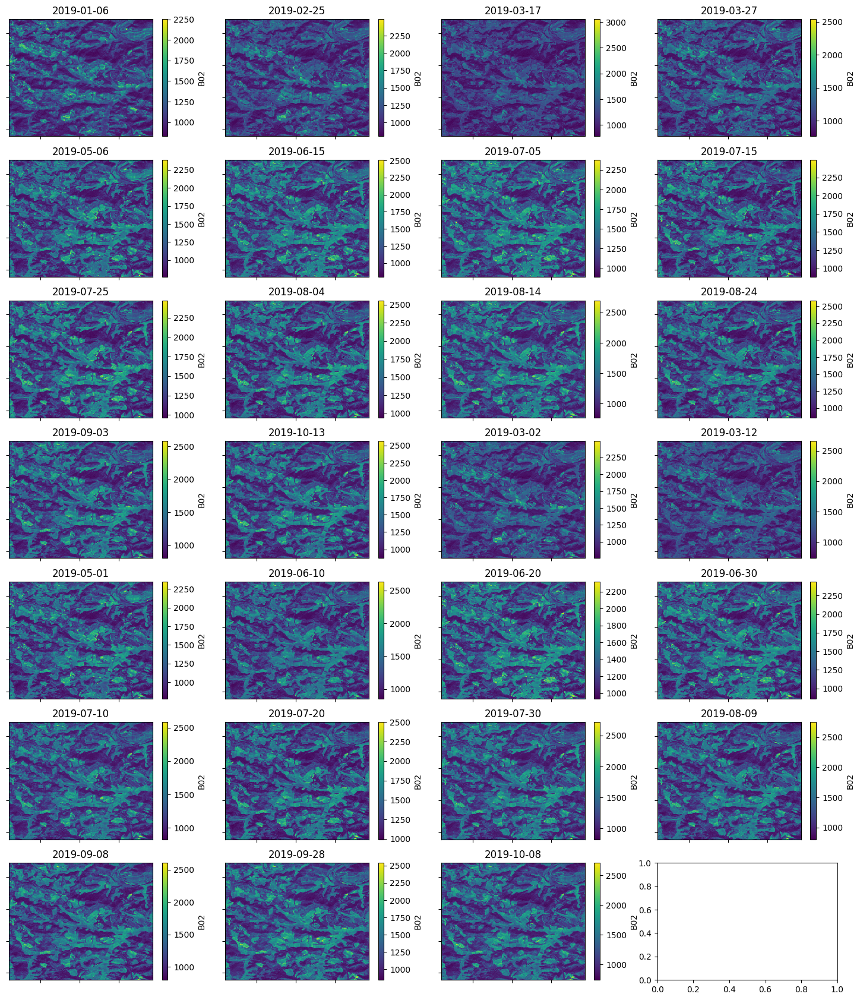

In [7]:
nimages = len(patch_data['B02']['band'].time)
ncols = 4
nrows = (nimages + ncols - 1) // ncols
height = nrows * 3
print(nimages, ncols, nrows, height)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, height))

for i, season in enumerate(patch_data['B02']['band']):
    if i >= nimages: break
    ax = axes.flat[i]
    cax = patch_data['B02']['band'].isel(time=i).plot(ax=ax)

for i, ax in enumerate(axes.flat):
    if i >= nimages: break
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])
    #ax.axes.axis('tight')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'{patch_data["B02"]["band"].isel(time=i).time.dt.strftime("%Y-%m-%d").values}')

plt.show()

## Plot monthly data from one band for the growing season

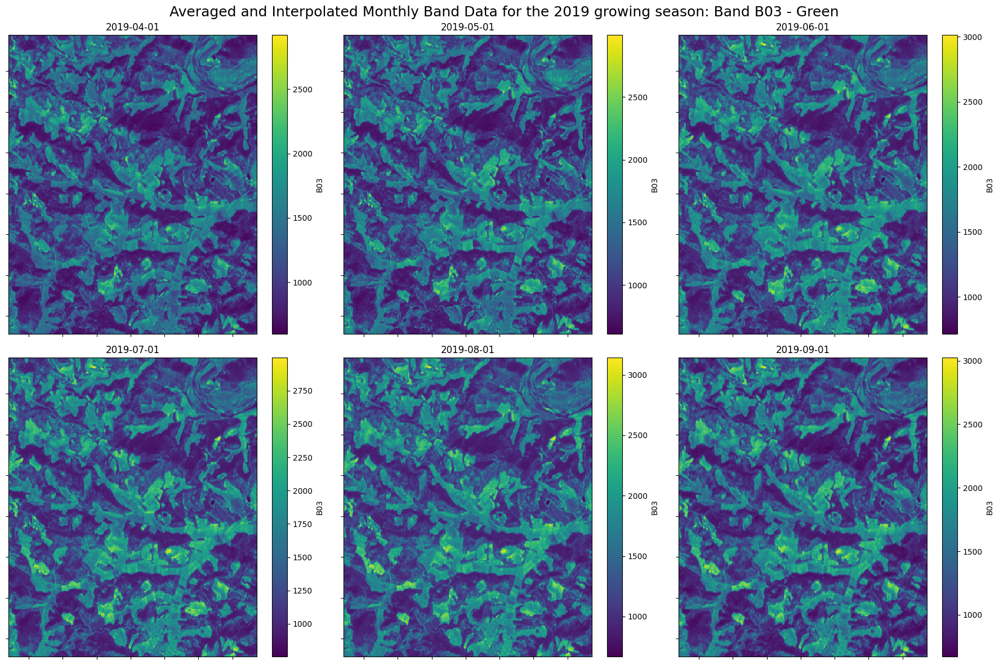

In [8]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))
fig.suptitle(f'Averaged and Interpolated Monthly Band Data for the {patch_data["year"]} growing season: Band {patch_data["B03"]["title"]}', fontsize=18)
    
for i in range(len(patch_data['B03']['monthly'])):
    ax = axes.flat[i]
    cax = patch_data['B03']['monthly'].isel(time_bins=i).plot(ax=ax)

for i, ax in enumerate(axes.flat):
    ax.axes.get_xaxis().set_ticklabels([])
    ax.axes.get_yaxis().set_ticklabels([])
    ax.axes.axis('tight')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_title(f'{patch_data["B03"]["monthly"].isel(time_bins=i).time_bins.dt.strftime("%Y-%m-%d").values}')

plt.tight_layout()
plt.show()

## Display band data, labels, and parcels

4 unique label indexes: [  0 330 353 442]
10 unique parcel ids: [      0 1097690 1098397 1098423 1098440 1098450 1098456 1100732 1100733
 1100734]


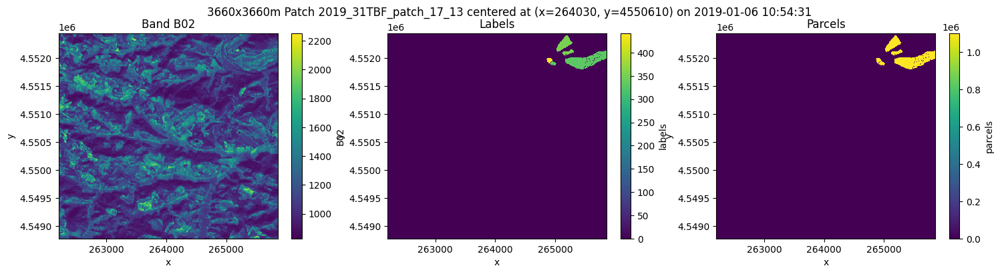

In [9]:
def show_patch(patch_data, time=0):

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 4))

    # Extract location information -- only available in the parcel group
    x = (np.array(patch_data['parcels'].coords['x'])[-1] + np.array(patch_data['parcels'].coords['x'])[0]) / 2
    y = (np.array(patch_data['parcels'].coords['y'])[-1] + np.array(patch_data['parcels'].coords['y'])[0]) / 2
    band_data = patch_data['B02']['band']

    # Extract time information
    ftime = band_data.isel(time=time).time.dt.strftime("%Y-%m-%d %H:%M:%S").values
    fig.suptitle(f'3660x3660m Patch {patch.patch_full_name} centered at (x={x:.0f}, y={y:.0f}) on {ftime}')
    
    band_data.isel(time=time).plot(ax=ax[0])
    ax[0].set_title(f'Band B02')

    labels = np.unique(patch_data['labels'].to_dataarray())
    print(f'{len(labels)} unique label indexes:', labels)
    patch_data['labels'].labels.plot(ax=ax[1])
    ax[1].set_title('Labels')

    parcels = np.unique(patch_data['parcels'].parcels)
    print(f'{len(parcels)} unique parcel ids:', parcels)
    patch_data["parcels"].parcels.plot(ax=ax[2])
    ax[2].set_title(f'Parcels')

show_patch(patch_data)

### Define directions

Arbitrarily decide that the positive directions are east and south, due to the increasing directions in our dataset

_look for negative numbers as an indication of an error in calculations_

In [10]:
def west(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['x']))[0]

def east(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['x']))[-1]

def north(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['y']))[0]

def south(patch_data):
    return np.sort(np.array(patch_data['parcels'].coords['y']))[-1]

def rangex(patch_data):
    return east(patch_data) - west(patch_data)
    
def rangey(patch_data):
    return south(patch_data) - north(patch_data)

print('west:', west(patch_data))
print('east:', east(patch_data))
print('north:', north(patch_data))
print('south:', south(patch_data))

west: 262205.0
east: 265855.0
north: 4548785.0
south: 4552435.0


## Functions for Label Access and Conversion

In [137]:
def decode_labels(labels):
    CROP_DECODING = dict((v,k) for k, v in CROP_ENCODING.items())
    CROP_DECODING[0] = "UNDEFINED"
    return np.vectorize(CROP_DECODING.get)(labels)

def decode_label(label):
    return decode_labels(label)

def get_label_list(patch_data):
    label_array = np.array(patch_data['labels'].to_dataarray()[0])
    label_list = np.sort(np.unique(label_array))[1:]
    return label_list

def get_label_idx_from_id(patch_data, label_id=0):
    labels = get_label_list(patch_data)
    label_idx = np.where(np.sort(labels) == label_id)[0]
    return label_idx

def get_label_id_from_idx(patch_data, label_index=0):
    labels = get_label_list(patch_data)
    label_id = np.sort(labels)[label_index]
    return label_id

def get_label_name_from_idx(patch_data, label_index=0):
    label_id = get_label_id_from_idx(patch_data, label_index)
    label_name = decode_label(label_id)
    return label_name

def get_label_data(patch_data):
    label_data = np.array(patch_data['labels'].to_dataarray())[0]
    return label_data

def get_label_mask_from_id(patch_data, label=0):
    label_data = get_label_data(patch_data)
    label_mask = np.zeros(label_data.shape, dtype=np.uint16)
    label_mask[label_data == label] = 1
    assert len(np.unique(label_mask)) > 1, "All pixels masked out"
    return label_mask

def get_label_mask_from_idx(patch_data, label_index=0):
    label_data = get_label_data(patch_data)
    label = get_label_id_from_idx(patch_data, label_index)
    #print('label:', label, ', label_index:', label_index)
    label_mask = np.zeros(label_data.shape, dtype=np.uint16)
    #print('label_mask.shape:', label_mask.shape, ', label:', label)
    #print('np.unique(label_mask):', np.unique(label_mask))
    label_mask[label_data == label] = 1
    #print('type(label_mask):', type(label_mask), ', label_mask.shape:', label_mask.shape)
    assert len(np.unique(label_mask)) > 1, "All pixels masked out"
    return label_mask

unique_indexes = get_label_list(patch_data)
print('get_label_list:', unique_indexes)

fields = decode_labels(unique_indexes)
print('decode_labels (Crops):', fields)

label_mask = get_label_mask_from_idx(patch_data, 0)
type(label_mask), label_mask.shape

get_label_list: [330 353 354 361 380 442 510 623 790 975 981 998]
decode_labels (Crops): ['Grapes' 'Cherries and sour cherries' 'Peaches and nectarines' 'Almonds'
 'Other fruits' 'Olives' 'Potatoes' 'Other temporary spice crops n.e.c.'
 'Leguminous crops n.e.c.' 'Fallow land' 'Other crops temporary'
 'Unknown crops']


(numpy.ndarray, (366, 366))

## Function to format Ticks on Plot Axes

* Pixels have 10m resolution, so update ticks to show 10m per pixel

In [138]:
def plot_tick_format(tick_val, tick_pos):
    return int(tick_val * 10)

## Highlight Label Bounding Boxes

* Read a mask image (such as a crop label)
* Draw an outline around labeled pixels
* Allow width specification
* Clear the original label

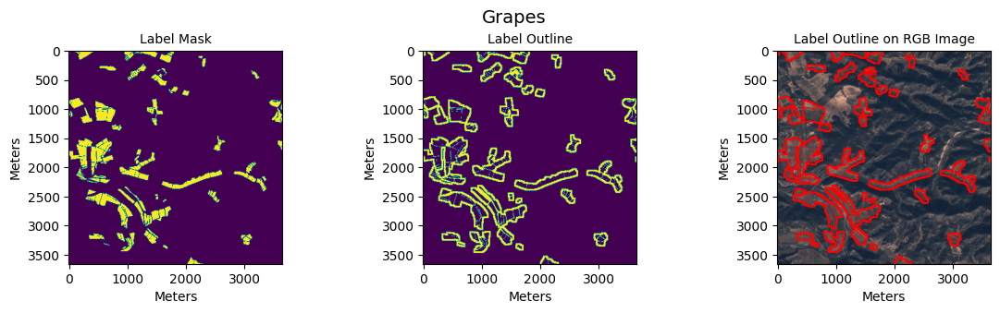

In [139]:
def draw_label_outline(image, color=1, width=3):
    #print('type(image):', type(image))
    outline_image = image.copy()
    
    # TODO: determine how to do this without a loop; maybe consider generic_filter
    for w in range(width):
        indicies = np.where((outline_image > 0))
        ai = np.array(indicies) + 1
        for addsub in [-1, 1]:
            for idx in range(2):
                for n in range(2):
                    ai=np.clip(ai, 0, 365)
                    outline_image[tuple(ai)] = color
                    ai[idx] = np.array(indicies)[idx] + addsub
    
    # Remove center
    outline_image[image > 0] = 0
    return outline_image

label_idx = 0
label = get_label_id_from_idx(patch_data, label_idx)
label_img = get_label_mask_from_idx(patch_data, label_idx)
outline = draw_label_outline(label_img)
rgb_outline = patch_data['rgbt0'].copy()
rgb_outline[outline != 0] = [0xFF,0,0]

fig, ax = plt.subplots(ncols=3, figsize=(14, 3))
fig.suptitle(f'{decode_labels([label])[0]}', y=1.03, fontsize=14)
ax[0].imshow(label_img)
ax[0].set_title(f'Label Mask', fontsize=10)
ax[0].xaxis.set_major_formatter(plot_tick_format)
ax[0].yaxis.set_major_formatter(plot_tick_format)
ax[0].set_xlabel('Meters')
ax[0].set_ylabel('Meters')
#ax[0].set_xticklabels([0, 1880, 3660])
ax[1].imshow(outline)
ax[1].set_title(f'Label Outline', fontsize=10)
ax[2].imshow(rgb_outline)
ax[2].set_title(f'Label Outline on RGB Image', fontsize=10)

for n in range(3):
    ax[n].xaxis.set_major_formatter(plot_tick_format)
    ax[n].yaxis.set_major_formatter(plot_tick_format)
    ax[n].set_xlabel('Meters')
    ax[n].set_ylabel('Meters')    

## Zoom to the masked RGB Crop data

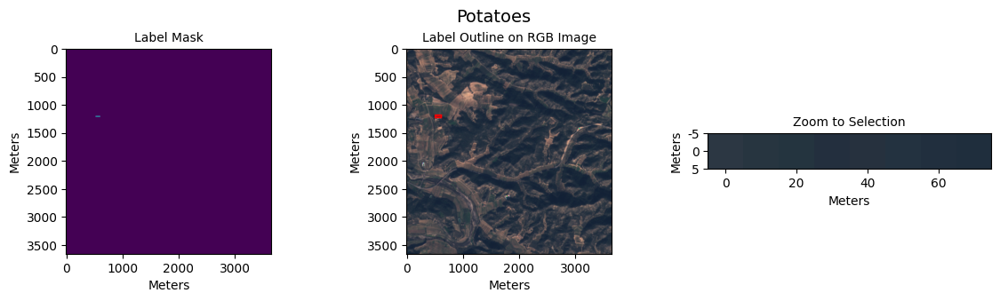

In [140]:
def auto_zoom(image):
    '''
    Zoom to the smallest image containing all non-white pixels

    If any non-white pixels exists on all 4 outer 
    '''
    indicies = np.array(np.where(np.all(image != (0xFF, 0xFF, 0xFF), axis=-1)))
    assert indicies.shape[1] > 0, "No non-white pixels were found in RGB image"
    top = np.min(indicies[0])
    bottom = np.min([365, np.max(indicies[0]) + 1])
    left = np.min(indicies[1])
    right = np.min([365, np.max(indicies[1]) + 1])
    #print('left:', left, ', right:', right, ', top:', top, ', bottom', bottom)
    return image[top:bottom, left:right, :]

def get_rgb_selection(patch_data, label_index=0):
    label_mask = get_label_mask_from_idx(patch_data, label_index)
    assert len(np.unique(label_mask)) > 1, "All pixels masked out"
    rgb3_selection = patch_data['rgbt0'].copy()
    rgb3_selection[label_mask == 0] = [0xFF,0xFF,0xFF]
    return rgb3_selection

# Note: this is obsolete, but may be used again later
def zoom_to_label(patch_data, label_index=0):
    rgb3_selection = get_rgb_selection(patch_data, label_index)
    return auto_zoom(rgb3_selection)

label_idx = 6

label = get_label_id_from_idx(patch_data, label_idx)
#print(f'label={label}')

label_mask = get_label_mask_from_idx(patch_data, label_idx)
#print(label_mask.shape)

outline = draw_label_outline(label_mask)
rgb_outline = patch_data['rgbt0'].copy()
rgb_outline[outline != 0] = [0xFF,0,0]
rgb3_selection = get_rgb_selection(patch_data, label_idx)
rgb_crop_zoom = auto_zoom(rgb3_selection)

fig, ax = plt.subplots(ncols=3, figsize=(14, 3))
fig.suptitle(f'{decode_labels([label])[0]}', y=1.03, fontsize=14)
ax[0].imshow(label_mask)
ax[0].set_title(f'Label Mask', fontsize=10)
ax[0].xaxis.set_major_formatter(plot_tick_format)
ax[0].yaxis.set_major_formatter(plot_tick_format)
ax[0].set_xlabel('Meters')
ax[0].set_ylabel('Meters')
ax[1].imshow(rgb_outline)
ax[1].set_title(f'Label Outline on RGB Image', fontsize=10)
ax[2].imshow(rgb_crop_zoom)
ax[2].set_title(f'Zoom to Selection', fontsize=10)

for n in range(3):
    ax[n].xaxis.set_major_formatter(plot_tick_format)
    ax[n].yaxis.set_major_formatter(plot_tick_format)
    ax[n].set_xlabel('Meters')
    ax[n].set_ylabel('Meters')    

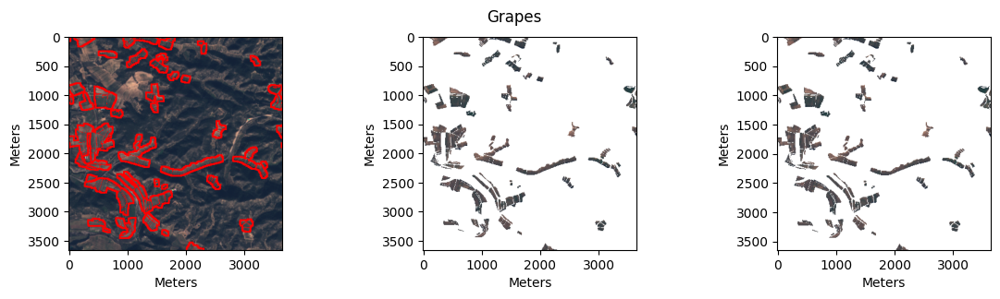

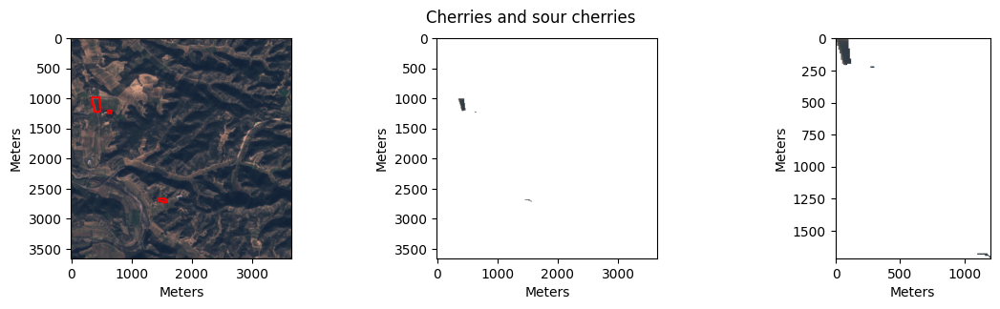

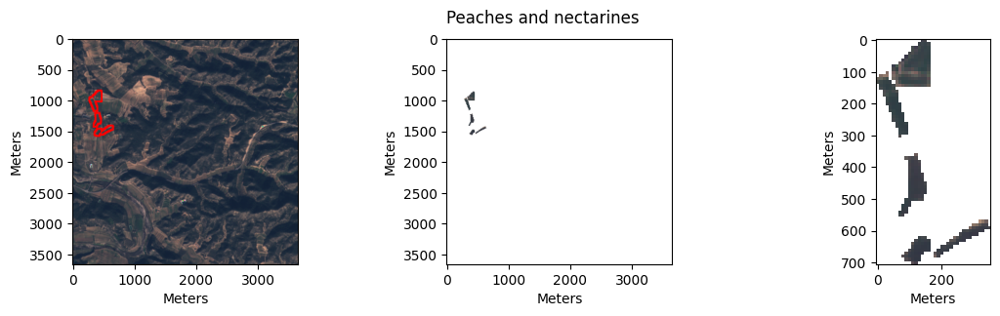

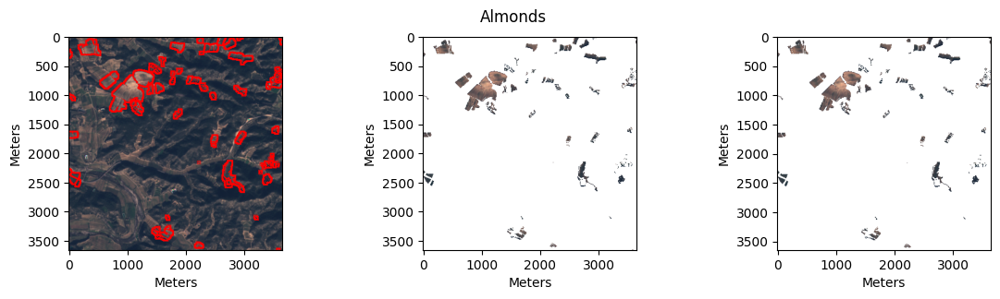

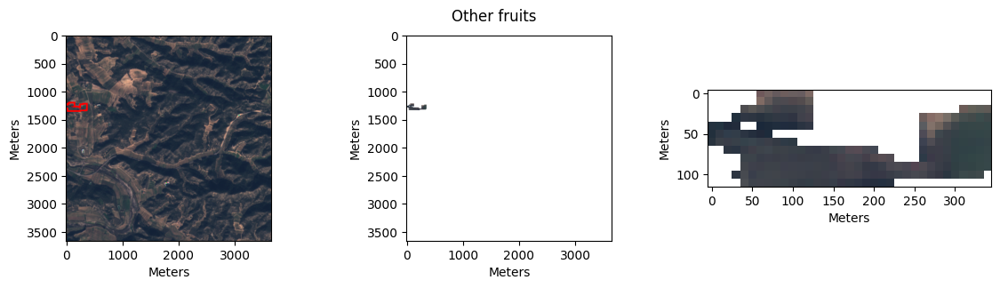

...

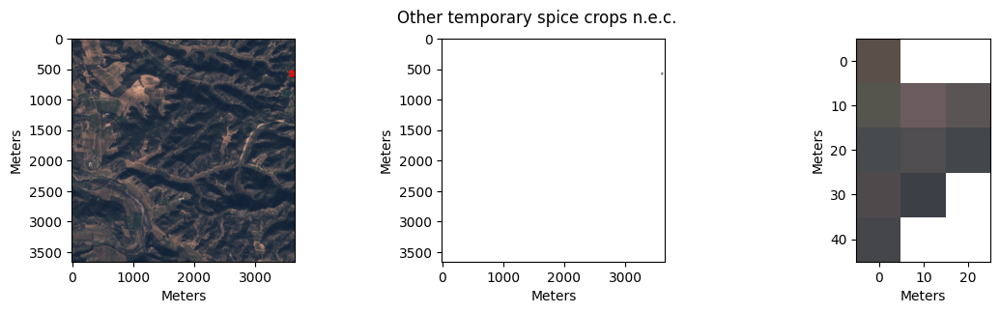

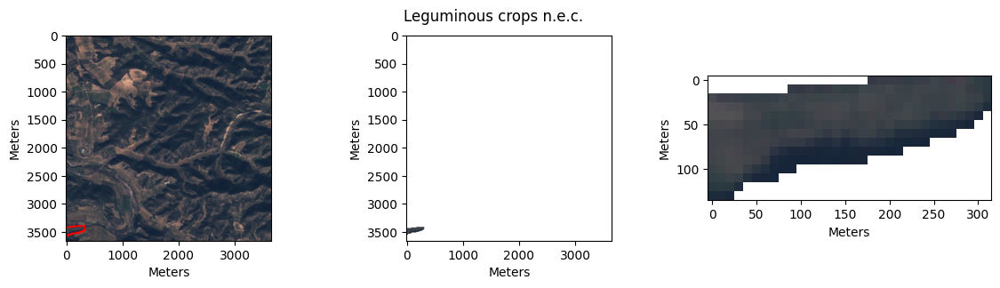

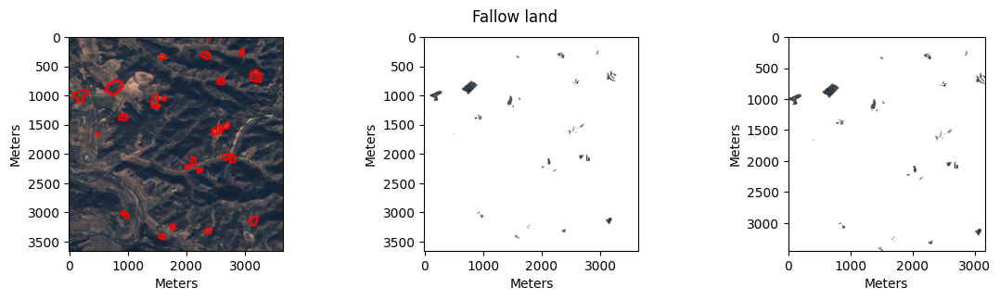

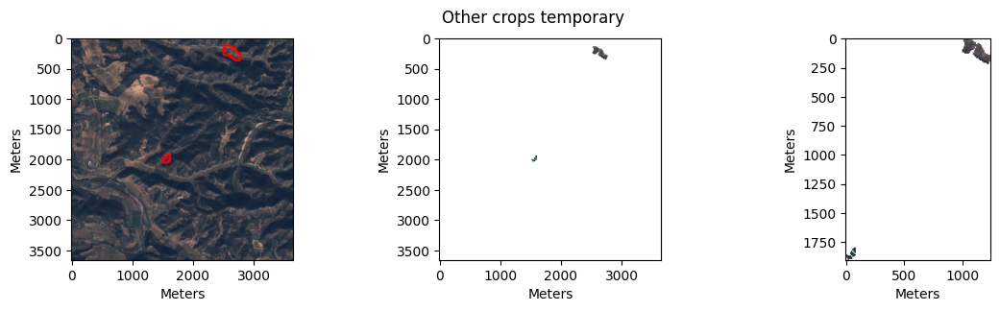

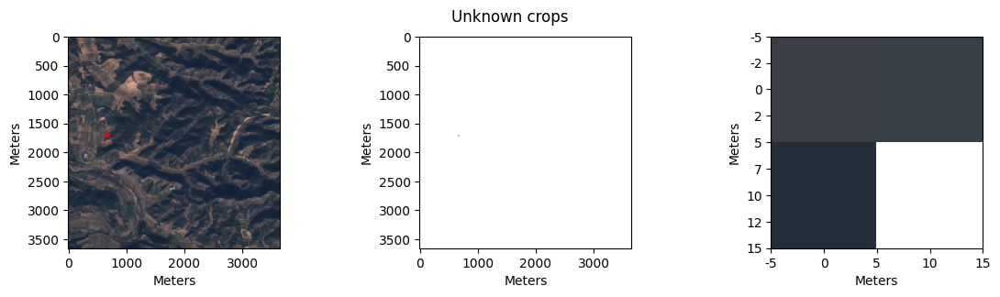

In [141]:
labels = get_label_list(patch_data)
for n,label in enumerate(labels):
    label_mask = get_label_mask_from_id(patch_data, label)
    outline = draw_label_outline(label_mask)
    rgb3_outline = patch_data['rgbt0'].copy()
    rgb3_outline[outline != 0] = [0xFF,0,0]

    rgb3_selection = patch_data['rgbt0'].copy()
    rgb3_selection[label_mask == 0] = [0xFF,0xFF,0xFF]
    rgb3_crop_zoom = auto_zoom(rgb3_selection)


    fig, ax = plt.subplots(ncols=3, figsize=(14, 3))
    fig.suptitle(f'{decode_labels([label])[0]}')
    ax[0].imshow(rgb3_outline)
    ax[1].imshow(rgb3_selection)
    ax[2].imshow(rgb3_crop_zoom)

    for n in range(3):
        ax[n].xaxis.set_major_formatter(plot_tick_format)
        ax[n].yaxis.set_major_formatter(plot_tick_format)
        ax[n].set_xlabel('Meters')
        ax[n].set_ylabel('Meters')
        #ax[n].set_ylim([0, :])    

## A function to draw all 4 band histograms of an entire patch

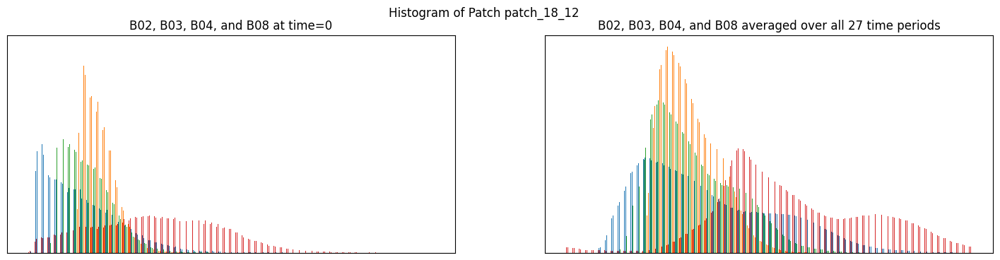

In [142]:
def draw_patch_histogram(patch_data):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 4))
    fig.suptitle(f'Histogram of Patch {patch_data["name"]}')
    ax0 = axes[0].hist([
            np.array(patch_data['B04']['band'].isel(time=0)).flatten(),
            np.array(patch_data['B02']['band'].isel(time=0)).flatten(),
            np.array(patch_data['B03']['band'].isel(time=0)).flatten(),
            np.array(patch_data['B08']['band'].isel(time=0)).flatten()
    ], bins=256)
    axes[0].set_xticks([])
    axes[0].set_yticks([])
    
    _ = axes[0].set_title(f'B02, B03, B04, and B08 at time=0')
    ax1 = axes[1].hist([
            patch_data['B04']['uint8'].flatten(),
            patch_data['B02']['uint8'].flatten(),
            patch_data['B03']['uint8'].flatten(),
            patch_data['B08']['uint8'].flatten()
    ], bins=256)
    _ = axes[1].set_title(f'B02, B03, B04, and B08 averaged over all {patch_data["B04"]["uint8"].shape[0]} time periods')
    axes[1].set_xticks([])
    axes[1].set_yticks([])
    
    plt.show()

draw_patch_histogram(patch_data)

## Draw the set of band histograms for a specific label

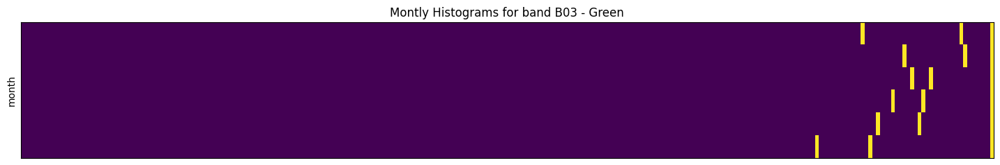

In [143]:
def plot_masked_hist_2(ax, band, mask, pixel_height=6):
    max = np.max(band)
    cmap = plt.colormaps['jet']
    nbins = 256
    __band = band.copy()
    hist = np.zeros((band.shape[0]*pixel_height, nbins))
    for n in range(band.shape[0]):
        __band_data = np.array(__band[n,:,:])
        __band_data[mask == 0] = 0
        hist[n*pixel_height:n*pixel_height+pixel_height], _ = np.histogram(__band_data, bins=nbins)
        hist[n*pixel_height:n*pixel_height+pixel_height,0] = 0
    #print(f'hist_max: {np.max(hist)}, shape: {hist.shape}, dtype: {hist.dtype}')
    _ = ax.imshow(hist)
    _ = ax.set_xticks([])

fig, ax = plt.subplots(figsize=(18, 4))
#fig.suptitle(f'Histogram of Patch {patch_data["name"]}')

_ = plot_masked_hist_2(ax, patch_data['B03']['monthly'], label_mask)
_ = ax.set_title(f'Montly Histograms for band {patch_data["B03"]["title"]}')
_ = ax.set_ylabel('month')
_ = ax.set_yticks([])


<class 'matplotlib.figure.Figure'>


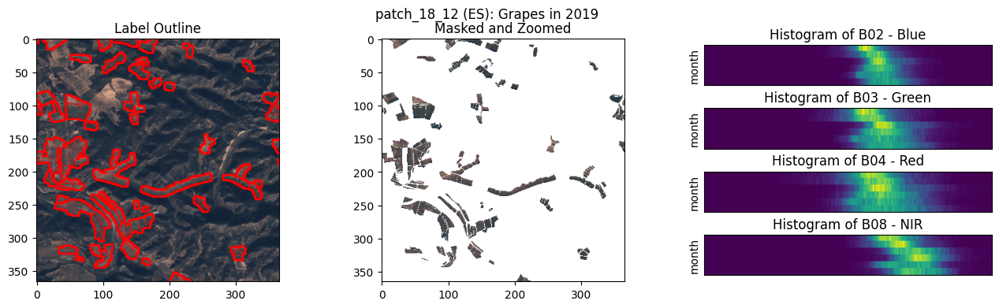

In [149]:
def plot_crop(patch_data, label_idx=0):
    name = get_label_name_from_idx(patch_data, label_idx)
    #print(f'Plotting "{name}" from {patch_data["name"]}')
    label_img = get_label_mask_from_idx(patch_data, label_idx)
    outline = draw_label_outline(label_img)
    rgb3_outline = patch_data['rgbt0'].copy()
    rgb3_outline[outline != 0] = [0xFF,0,0]
    
    label_mask = get_label_mask_from_idx(patch_data, label_idx)
    rgb3_selection = patch_data['rgbt0'].copy()
    rgb3_selection[label_mask == 0] = [0xFF,0xFF,0xFF]
    
    rgb3_crop_zoom = auto_zoom(rgb3_selection)
    
    fig = plt.figure(figsize=(16, 4))
    fig.suptitle(f'{patch_data["name"]} ({patch_data["patch_country_code"]}): {name} in {patch_data["year"]}')
    gs = gridspec.GridSpec(4,3)
    
    ax0 = fig.add_subplot(gs[:,0])
    ax0.imshow(rgb3_outline)
    ax0.set_title('Label Outline')
    
    ax1 = fig.add_subplot(gs[:,1])
    ax1.imshow(rgb3_crop_zoom)
    ax1.set_title('Masked and Zoomed')
    
    ax20 = fig.add_subplot(gs[0,2])
    _ = plot_masked_hist_2(ax20, patch_data['B02']['monthly'], label_mask)
    _ = ax20.set_title(f'Histogram of {patch_data["B02"]["title"]}')
    _ = ax20.set_ylabel('month')
    _ = ax20.set_yticks([])
    
    ax21 = fig.add_subplot(gs[1,2])
    _ = plot_masked_hist_2(ax21, patch_data['B03']['monthly'], label_mask)
    _ = ax21.set_title(f'Histogram of {patch_data["B03"]["title"]}')
    _ = ax21.set_ylabel('month')
    _ = ax21.set_yticks([])
    
    ax22 = fig.add_subplot(gs[2,2])
    _ = plot_masked_hist_2(ax22, patch_data['B04']['monthly'], label_mask)
    _ = ax22.set_title(f'Histogram of {patch_data["B04"]["title"]}')
    _ = ax22.set_ylabel('month')
    _ = ax22.set_yticks([])
    
    ax23 = fig.add_subplot(gs[3,2])
    _ = plot_masked_hist_2(ax23, patch_data['B08']['monthly'], label_mask)
    _ = ax23.set_title(f'Histogram of {patch_data["B08"]["title"]}')
    _ = ax23.set_ylabel('month')
    _ = ax23.set_yticks([])

    print(type(fig))
    #for n in range(3):
    #    ax[n].xaxis.set_major_formatter(plot_tick_format)
    #    ax[n].yaxis.set_major_formatter(plot_tick_format)
    #    ax[n].set_xlabel('Meters')
    #    ax[n].set_ylabel('Meters')
    #    #ax[n].set_ylim([0, :])    

plot_crop(patch_data, 0)

## Plot all crops in a patch

In [ ]:
labels = get_label_list(patch_data)
for n,label in enumerate(labels):
    #print(f'Plotting patch data for label {n}: {label}')
    plot_crop(patch_data, n)

## Plot all crops in a patch file

In [ ]:
print(f'{len(files)} NetCDF4 files')
print(files[0:5])
%time patch, patch_data = load_patch_file(files[4])
#patch
labels = get_label_list(patch_data)
for n,label in enumerate(labels):
    plot_crop(patch_data, n)

## Find the same crop in 2 different patches

In [ ]:
#print(files[0:5])
unique_labels = []
for n in range(2):
    print(f'load file {n}: {files[n]}')
    patch = netCDF4.Dataset(Path(files[n]), 'r')
    labels = xr.open_dataset(xr.backends.NetCDF4DataStore(patch['labels']))
    unique_labels.append(np.unique(labels.to_dataarray())[1:])
    print(f'unique_labels:', unique_labels[-1])

label_intersections = unique_labels[0][np.in1d(unique_labels[0], unique_labels[1])]
label_intersections

In [ ]:
def plot_crop_from_patch_file(patch_file, crop_label):
    print('patch_file:', patch_file)
    patch, patch_data = load_patch_file(patch_file)
    print(f'patch_data from {patch_data["name"]}')
    crop_idx = get_label_idx_from_id(patch_data, crop_label)
    plot_crop(patch_data, crop_idx)

plot_crop_from_patch_file(files[0], 330)
plot_crop_from_patch_file(files[1], 330)

In [ ]:
def plot_crop_from_patch_file(patch_file, crop_label):
    print('patch_file:', patch_file)
    patch, patch_data = load_patch_file(patch_file)
    print(f'patch_data from {patch_data["name"]}')
    crop_idx = get_label_idx_from_id(patch_data, crop_label)
    plot_crop(patch_data, crop_idx)

plot_crop_from_patch_file(files[0], 361)
plot_crop_from_patch_file(files[1], 361)

## Combine the same crop data from 2 different patchsets

In [145]:
patch1, patch_data1 = load_patch_file(files[0])
patch2, patch_data2 = load_patch_file(files[1])

patch file "dataset/netcdf/2019_31TBF_patch_17_11.nc" contains patch data from patch_17_11
patch file "dataset/netcdf/2019_31TBF_patch_17_12.nc" contains patch data from patch_17_12


(6, 366, 366) float64
band_max: 3996.0
hist_height: 36


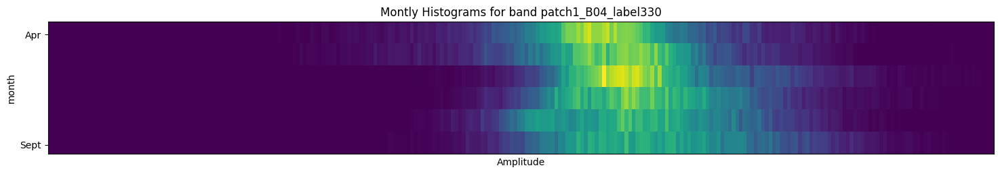

In [179]:
import matplotlib.ticker as ticker

def plot_masked_band_hist(ax, masked_band, pixel_height=6):
    max = np.max(masked_band)
    print(f"band_max: {max}")
    cmap = plt.colormaps['jet']
    nbins = 256
    hist = np.zeros((masked_band.shape[0]*pixel_height, nbins))
    for n in range(masked_band.shape[0]):
        __band_data = np.array(masked_band[n,:,:])
        hist[n*pixel_height:n*pixel_height+pixel_height], _ = np.histogram(__band_data, bins=nbins)
        hist[n*pixel_height:n*pixel_height+pixel_height,0] = 0
    print('hist_height:', n*pixel_height+pixel_height)
    ymin = pixel_height / 2
    ymax = n * pixel_height + pixel_height - pixel_height / 2
    _ = ax.imshow(hist)
    _ = ax.set_xticks([])
    _ = ax.yaxis.set_major_locator(ticker.FixedLocator([ymin, ymax]))
    _ = ax.set_yticklabels(['Apr', 'Sept'])
    _ = ax.set_xlabel('Amplitude')

fig, ax = plt.subplots(figsize=(18, 4))
#fig.suptitle(f'Histogram of Patch {patch_data["name"]}')

patch1_B04_label330 = np.array(patch_data['B04']['monthly'].copy())
label_mask = get_label_mask_from_idx(patch_data, label_idx)
patch1_B04_label330[:,label_mask == 0] = 0
print(patch1_B04_label330.shape, patch1_B04_label330.dtype)

_ = plot_masked_band_hist(ax, patch1_B04_label330)
_ = ax.set_title(f'Montly Histograms for band patch1_B04_label330')
_ = ax.set_ylabel('month')


[0]
['Grapes']
(6, 366, 366) float64
band_max: 2029.75
band_max: 2563.5
band_max: 3556.5
band_max: 4698.5


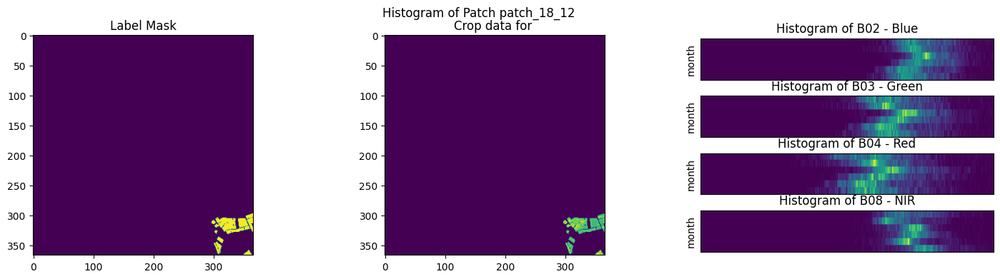

In [167]:
label_idx1 = get_label_idx_from_id(patch_data1, 330)
print(label_idx1)
name1 = get_label_name_from_idx(patch_data1, label_idx1)
print(name1)
label_mask1 = get_label_mask_from_idx(patch_data1, label_idx1)

patch1_B04_label330 = np.array(patch_data1['B02']['monthly'].copy())
patch1_B04_label330[:,label_mask1 == 0] = 0
print(patch1_B04_label330.shape, patch1_B04_label330.dtype)

fig = plt.figure(figsize=(18, 4))
fig.suptitle(f'Histogram of Patch {patch_data["name"]}')
gs = gridspec.GridSpec(4,3)

ax0 = fig.add_subplot(gs[:,0])
ax0.imshow(label_mask1)
ax0.set_title('Label Mask')

ax1 = fig.add_subplot(gs[:,1])
ax1.imshow(patch1_B04_label330[0])
ax1.set_title('Crop data for ')

for n, band in enumerate(['B02', 'B03', 'B04', 'B08']):
    masked_band = np.array(patch_data1[band]['monthly'].copy())
    masked_band[:,label_mask1 == 0] = 0
    ax20 = fig.add_subplot(gs[n,2])
    _ = plot_masked_band_hist(ax20, masked_band)
    _ = ax20.set_title(f'Histogram of {patch_data1[band]["title"]}')
    _ = ax20.set_ylabel('month')
    _ = ax20.set_yticks([])
plt.show()